In [1]:
# Import Custom Modules
from src.Cleaner import cleaning
from src.Import import load_pitch_data_from_s3
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, accuracy_score, recall_score, precision_score, plot_confusion_matrix, log_loss, make_scorer

from sklearn.model_selection import cross_val_score, train_test_split, GridSearchCV, KFold
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier

from scipy import stats
%matplotlib inline

In [2]:
files=['data/barrell BREAKING.csv','data/barrell FAST.csv','data/barrell OFFSPEED.csv','data/flare:burner BREAKING.csv','data/flare:burner FAST.csv',
       'data/flare:burner OFFSPEED.csv','data/no contact BREAKING.csv','data/no contact FAST.csv','data/no contact OFFSPEED.csv','data/poor:top BREAKING.csv',
      'data/poor:top OFFSPEED.csv','data/poor:top FAST.csv','data/poor:under BREAKING.csv','data/poor:under OFFSPEED.csv','data/poor:under FAST.csv',
      'data/poor:weak BREAKING.csv','data/poor:weak OFFSPEED.csv','data/poor:weak FAST.csv','data/solid contact BREAKING.csv',
       'data/solid contact OFFSPEED.csv','data/solid contact FAST.csv']

In [10]:
file=load_pitch_data_from_s3(files)

In [4]:
file=cleaning(file)

In [5]:
data=file.copy()
data=data.drop(columns='contact quality')

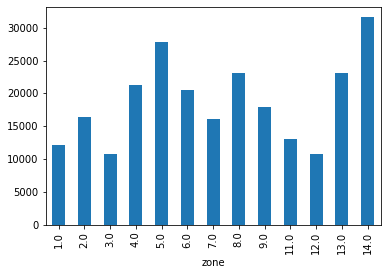

In [15]:
group = file.groupby('zone')


group['contact quality'].count().plot(kind='bar');

plt.savefig('images/zonebar.png')

ValueError: shape mismatch: objects cannot be broadcast to a single shape

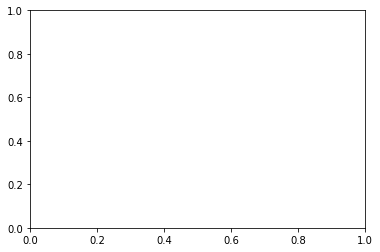

In [11]:
fig, ax = plt.subplots()
ax.bar(data['zone'],group['contact quality'].count())

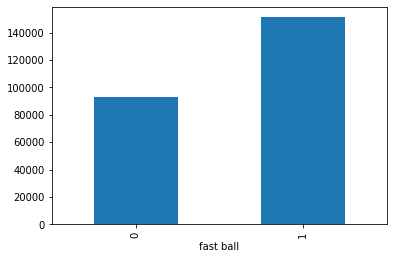

In [12]:
group = file.groupby('fast ball')
group['contact quality'].count().plot(kind='bar');

plt.savefig('images/fastbar.png')

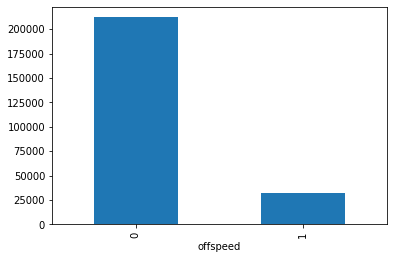

In [13]:
group = file.groupby('offspeed')
group['contact quality'].count().plot(kind='bar');

plt.savefig('images/offspeedbar.png')

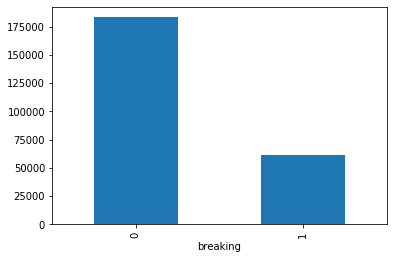

In [14]:
group = file.groupby('breaking')
group['contact quality'].count().plot(kind='bar');

plt.savefig('images/breakingbar.png')

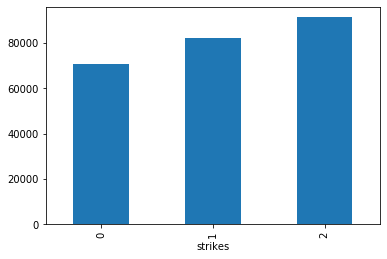

In [21]:
group = file.groupby('strikes')
group['contact quality'].count().plot(kind='bar');

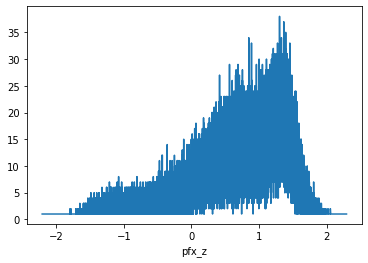

In [32]:
group = file.groupby('pfx_z')
group['contact quality'].count().plot(kind='line');

In [39]:
file['pfx_z'].median()

0.7958

37781

In [6]:
import plotly_express as px

In [19]:
px.scatter(file,file['release_spin_rate'],file['launch_speed'],color=file['pitch_type'])

In [21]:
#px.bar(file,file['outs_when_up'],file['launch_speed'])

In [12]:
file.columns

Index(['pitch_type', 'game_date', 'release_speed', 'release_pos_x',
       'release_pos_z', 'player_name', 'batter', 'pitcher', 'events',
       'description', 'spin_dir', 'spin_rate_deprecated',
       'break_angle_deprecated', 'break_length_deprecated', 'zone', 'des',
       'game_type', 'stand', 'p_throws', 'home_team', 'away_team', 'type',
       'hit_location', 'bb_type', 'balls', 'strikes', 'game_year', 'pfx_x',
       'pfx_z', 'plate_x', 'plate_z', 'on_3b', 'on_2b', 'on_1b',
       'outs_when_up', 'inning', 'inning_topbot', 'hc_x', 'hc_y',
       'tfs_deprecated', 'tfs_zulu_deprecated', 'fielder_2', 'umpire', 'sv_id',
       'vx0', 'vy0', 'vz0', 'ax', 'ay', 'az', 'sz_top', 'sz_bot',
       'hit_distance_sc', 'launch_speed', 'launch_angle', 'effective_speed',
       'release_spin_rate', 'release_extension', 'game_pk', 'pitcher.1',
       'fielder_2.1', 'fielder_3', 'fielder_4', 'fielder_5', 'fielder_6',
       'fielder_7', 'fielder_8', 'fielder_9', 'release_pos_y',
       'estima